<a href="https://colab.research.google.com/github/JulieHohenberg/DeepLearningFinal2025/blob/main/notebooks/img2img_clip_mlp_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Notebook Summary**
This notebook develops a hybrid **AI-vs-Human art classifier** that fuses **semantic features** from **CLIP embeddings** with **stylistic signals** from the **Stable Diffusion Turbo VAE latent space**. It begins by **cloning and running the [img2img-turbo repository](https://github.com/GaParmar/img2img-turbo)**, preparing and splitting a [**Kaggle dataset**](https://www.kaggle.com/datasets/doctorstrange420/real-and-fake-ai-generated-art-images-dataset) of human and AI-generated artwork, and **augmenting images** using diffusion-based style transformations to enhance class robustness. Extracted **CLIP and VAE features** are concatenated into **768-dimensional vectors** and used to train a lightweight **Fusion-MLP classifier** achieving strong validation accuracy. The notebook concludes with **Grad-CAM visualizations** over the **VAE encoder** and **U-Net attention layers**, highlighting the regions and textures most influential in distinguishing AI from human art.

#### **Pipeline Overview**

**1. Input:**  
Images from the Kaggle *AI vs Human Art* dataset (both AI-generated and human-made)

**2. Data Augmentation:**

**img2img-turbo:** creates stylized varients of training data to exaggerate class-specific patterns
- **AI-Generated Art Prompt:**  
    *“digital futuristic artwork, smooth vivid colors, hyperrealistic lighting”*  
- **Human Art Prompt:**  
    *“traditional painting, brush strokes, canvas texture, artistic imperfections”*  

**2. Dual Feature Extraction:**  
- **CLIP Encoder:** captures **semantic & stylistic meaning**  
  → "What the image looks like"  
- **SD-Turbo VAE Encoder:** `(latent-space engine INSIDE img2img-turbo)` captures **generator fingerprints**  
  → "How the image was encoded by a diffusion model"

**3. Feature Fusion:**  
- Concatenate **512-D CLIP** + **256-D VAE** → **768-D fused vector**

**4. Classification:**  
- A small **MLP classifier** learns to separate AI vs Human based on fused features

**5. Output:**  
- **Prediction:** *AI-Generated* or *Human-Made* artwork

---

**Result:**  
This fusion allows the model to reason both **semantically** (content & style)  
and **structurally** (generator signatures), creating a more robust and explainable classifier.

---
**Explainability:**  
- Grad-CAM is applied to the **SD-Turbo VAE encoder** during the **feature extraction stage**, before any classifier training.  
At this point, the encoder is **not told whether an image is AI-generated or human-made** — it simply encodes all inputs into latent representations.  

- Grad-CAM visualizations reveal which **textural and structural regions** (e.g., brush strokes, lighting gradients, surface smoothness) the VAE focuses on when encoding each image, providing insight into how the model later distinguishes AI vs human art.

---
**Next Steps:**
- Implement additional explainability for CLIP embeddings.
- Utilize an LLM for explainability.
- Try additional models beyond MLP.

### Clone Img2Img Repo
Clones the img2img-turbo repository to access its pre-trained diffusion and VAE components used later for image augmentation and feature extraction.

In [ ]:
!git clone https://github.com/GaParmar/img2img-turbo.git
%cd img2img-turbo

Cloning into 'img2img-turbo'...
remote: Enumerating objects: 255, done.
remote: Counting objects: 100% (118/118), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 255 (delta 89), reused 62 (delta 62), pack-reused 137 (from 1)
Receiving objects: 100% (255/255), 31.91 MiB | 33.58 MiB/s, done.
Resolving deltas: 100% (128/128), done.
/content/img2img-turbo


Install dependencies

In [ ]:
!pip install -r requirements.txt

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-install-ff91dt2x/clip_f6f660db5af54016a5ad61b2194aa281
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-ff91dt2x/clip_f6f660db5af54016a5ad61b2194aa281
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 35.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.5 MB/s 

Run a sample Pix2Pix-Turbo example (edge → image)

In [ ]:
!python src/inference_paired.py \
  --model_name "edge_to_image" \
  --input_image "assets/examples/bird.png" \
  --prompt "a blue bird" \
  --output_dir "outputs"

2025-11-07 20:59:18.933854: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762549158.960659    1197 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762549158.967633    1197 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1762549158.984591    1197 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762549158.984617    1197 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762549158.984622    1197 computation_placer.cc:177] computation placer alr

Display generated image

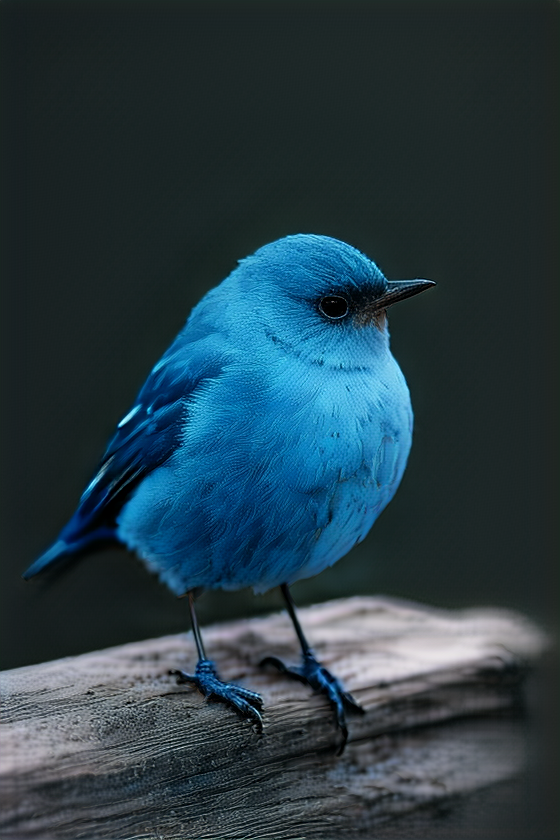

In [ ]:
from PIL import Image
from IPython.display import display

display(Image.open("outputs/bird.png"))

### Load Kaggle Dataset
Downloads and unzips the AI vs Human Art dataset from Kaggle into the working directory, with Drive used to securely store the API key and data backup.

*Kaggle data stored in Drive for backup*

In [ ]:
# Install the Kaggle API client if not already installed
!pip install -q kaggle

# Mount your Google Drive so you can access kaggle.json securely
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os, shutil

# Create the hidden .kaggle directory where API credentials must live
os.makedirs(os.path.expanduser("~/.kaggle"), exist_ok=True)

# Copy API key file from Drive
src_kaggle = "/content/drive/MyDrive/Deep_Learning_Final_Project/notebooks/kaggle.json"
dst_kaggle = os.path.expanduser("~/.kaggle/kaggle.json")
if os.path.exists(dst_kaggle):
    os.remove(dst_kaggle)
shutil.copy(src_kaggle, dst_kaggle)

# Restrict file permissions so only you can read the key
!chmod 600 ~/.kaggle/kaggle.json

# Download the AI-vs-Human Art dataset from Kaggle
dataset_zip = "ai-and-human-art-classification.zip"
if os.path.exists(dataset_zip):
    os.remove(dataset_zip)
!kaggle datasets download -d kausthubkannan/ai-and-human-art-classification --force

# Unzip into a local folder named "data"
data_dir = "data"
target_dir = os.path.join(data_dir, "ai_art_classification")
if os.path.exists(target_dir):
    shutil.rmtree(target_dir)
os.makedirs(data_dir, exist_ok=True)
!unzip -q ai-and-human-art-classification.zip -d data/

print("✅ Dataset refreshed and ready at:", target_dir)

Split into train/val/test

In [ ]:
import os, shutil, random

base_dir = "data/ai_art_classification/train"
new_base = "data/ai_art_split"

# remove old split folder if it exists so rerunning doesn't duplicate files
if os.path.exists(new_base):
    shutil.rmtree(new_base)

# create new folder structure
for split in ["train", "val", "test"]:
    for cls in ["AI_GENERATED", "NON_AI_GENERATED"]:
        os.makedirs(os.path.join(new_base, split, cls), exist_ok=True)

# define split ratios (70% train, 15% val, 15% test)
split_ratios = {'train': 0.7, 'val': 0.15, 'test': 0.15}
random.seed(42)

# go through each class folder and split its images according to ratios
for cls in ["AI_GENERATED", "NON_AI_GENERATED"]:
    src_dir = os.path.join(base_dir, cls)
    all_imgs = [f for f in os.listdir(src_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(all_imgs)
    n = len(all_imgs)

    # compute split cutoffs
    train_cut = int(split_ratios['train'] * n)
    val_cut = int(split_ratios['val'] * n)

    # assign each split a portion of images
    splits = {
        'train': all_imgs[:train_cut],
        'val': all_imgs[train_cut:train_cut + val_cut],
        'test': all_imgs[train_cut + val_cut:]
    }

    # copy files into their new split folders
    for split, files in splits.items():
        dest = os.path.join(new_base, split, cls)
        for f in files:
            shutil.copy(os.path.join(src_dir, f), os.path.join(dest, f))

print("✅ Done splitting into train/val/test folders!")

✅ Done splitting into train/val/test folders!


Load dataset with PyTorch

(Fix sympy version error first)

In [ ]:
!pip install sympy==1.12 --quiet
import sympy
print("Sympy version:", sympy.__version__)

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.8.0+cu126 requires sympy>=1.13.3, but you have sympy 1.12 which is incompatible.
Sympy version: 1.12


In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# training transformations add random flips for augmentation
train_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# validation/test transforms are deterministic (no augmentation)
test_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# load datasets from new split folders
train_ds = datasets.ImageFolder("data/ai_art_split/train", transform=train_tfms)
val_ds   = datasets.ImageFolder("data/ai_art_split/val", transform=test_tfms)
test_ds  = datasets.ImageFolder("data/ai_art_split/test", transform=test_tfms)

# create dataloaders for batching and shuffling
train_dl = DataLoader(train_ds, batch_size=32, shuffle=True)
val_dl   = DataLoader(val_ds, batch_size=32)
test_dl  = DataLoader(test_ds, batch_size=32)

# print summary of dataset sizes and classes
print(train_ds.classes)
print(f"Train: {len(train_ds)} | Val: {len(val_ds)} | Test: {len(test_ds)}")

['AI_GENERATED', 'NON_AI_GENERATED']
Train: 13031 | Val: 2792 | Test: 2795


Display some of the dataset we loaded

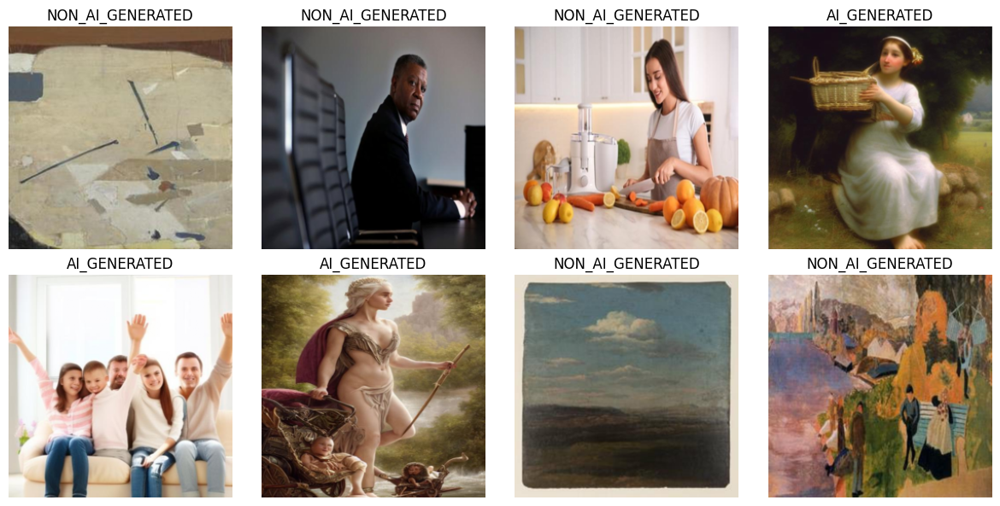

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def denorm(img_tensor):
    img_tensor = img_tensor * 0.5 + 0.5  # reverse normalization
    return np.clip(img_tensor.permute(1, 2, 0).numpy(), 0, 1)

# get one batch of images
images, labels = next(iter(train_dl))
classes = train_ds.classes

plt.figure(figsize=(12, 6))
for i in range(8):  # show 8 sample images
    plt.subplot(2, 4, i+1)
    plt.imshow(denorm(images[i]))
    plt.title(classes[labels[i].item()])
    plt.axis('off')
plt.tight_layout()
plt.show()

### Preprocess with img2img
Clones the img2img-turbo repository to access its pre-trained diffusion and VAE components used later for image augmentation and feature extraction.

*Augmented images already saved in Drive, no need to re-run all cells:*
`/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented`

Only run last cell in this markdown, titled "**Finish dataset preparation:** Combine original + augmented data into PyTorch loaders"

Load turbo pipeline

In [ ]:
# Import the lightweight one-step Stable Diffusion model (img2img-turbo)
from diffusers import StableDiffusionImg2ImgPipeline
import torch
from PIL import Image
import os

# Automatically use GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the pre-trained Stable Diffusion Turbo model (faster and smaller than full SD)
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "stabilityai/sd-turbo",
    torch_dtype=torch.float16
).to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


**Preprocess:** Create new, AI-generated augmentations of existing training images using img2img-turbo diffusion model.

Goal: Teach our classifier to recognize style-level differences between AI and human art more robustly by exaggerating them with controlled image transformations.

In [ ]:
import os, random
from PIL import Image

# Keep track of your main dataset location
split_root = "data/ai_art_split"
aug_root = "data/ai_art_augmented"
os.makedirs(aug_root, exist_ok=True)

# Define stylistic prompts that enhance each class
prompt_base = {
    "AI_GENERATED": "digital futuristic artwork, smooth vivid colors, hyperrealistic lighting",
    "NON_AI_GENERATED": "traditional painting, brush strokes, canvas texture, artistic imperfections"
}

def turbo_augment(input_dir, output_dir, prompt_dict, num_images=100):
    """
    Generate additional stylized versions of images using the img2img-turbo model.
    These augmentations help the classifier learn more robust representations
    by exaggerating stylistic differences between AI and human art.
    """
    classes = ["AI_GENERATED", "NON_AI_GENERATED"]
    generated_files = []

    for c in classes:
        src = os.path.join(input_dir, "train", c)
        dst = os.path.join(output_dir, "train", c)
        os.makedirs(dst, exist_ok=True)

        # Select a random subset for augmentation
        all_imgs = [f for f in os.listdir(src) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        random.shuffle(all_imgs)
        imgs = all_imgs[:num_images]

        for img_name in imgs:
            img_path = os.path.join(src, img_name)
            image = Image.open(img_path).convert("RGB").resize((512,512))
            prompt = prompt_dict[c]

            # Generate stylized variant through img2img-turbo
            out = pipe(
                prompt=prompt,
                image=image,
                strength=0.4,        # how much to modify (low = subtle style shift)
                guidance_scale=0.0   # rely on visual content more than text
            ).images[0]

            out.save(os.path.join(dst, f"turbo_{img_name}"))
            generated_files.append(f"turbo_{img_name}")

    return generated_files

# Run augmentation process
augmented = turbo_augment(split_root, aug_root, prompt_base, num_images=300)
print(f"✅ Generated {len(augmented)} augmented training images.")

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

✅ Generated 600 augmented training images.


**Save above images to Drive**

In [ ]:
import shutil

# Define where you want to store them permanently in Drive
drive_backup_dir = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented"

# Create the folder (and overwrite old backup if needed)
if os.path.exists(drive_backup_dir):
    print("⚠️ Backup folder already exists. Removing and replacing old version...")
    shutil.rmtree(drive_backup_dir)

# Copy everything from local to Drive
shutil.copytree("data/ai_art_augmented", drive_backup_dir)

print(f"✅ Augmented images saved to Drive: {drive_backup_dir}")

✅ Augmented images saved to Drive: /content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented


**Finish dataset preparation:** Combine original + augmented data into PyTorch loaders

In [ ]:
import os
import torchvision.transforms as T
from torchvision import datasets
from torch.utils.data import DataLoader, ConcatDataset

# Original local dataset (already split earlier)
split_root = "data/ai_art_split"

# Path to augmented images on Drive (from backup cell)
aug_root = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented"

# Preprocessing for all datasets
tfms = T.Compose([
    T.Resize((256,256)),
    T.ToTensor(),
    T.Normalize([0.5]*3, [0.5]*3)
])

# Load base datasets
orig_train = datasets.ImageFolder(os.path.join(split_root, "train"), transform=tfms)
val_ds     = datasets.ImageFolder(os.path.join(split_root, "val"),  transform=tfms)
test_ds    = datasets.ImageFolder(os.path.join(split_root, "test"), transform=tfms)

# Load the Turbo-augmented dataset from Drive
aug_train  = datasets.ImageFolder(os.path.join(aug_root, "train"), transform=tfms)

# Combine them
train_ds = ConcatDataset([orig_train, aug_train])

# Build DataLoaders
train_dl = DataLoader(train_ds, batch_size=32, shuffle=True)
val_dl   = DataLoader(val_ds, batch_size=32)
test_dl  = DataLoader(test_ds, batch_size=32)

print(f"✅ Loaded datasets successfully!")
print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}  |  Test: {len(test_ds)}")

✅ Loaded datasets successfully!
Train: 13631  |  Val: 2792  |  Test: 2795


### CLIP
Loads the CLIP image encoder and SD-Turbo VAE encoder to extract semantic and stylistic features respectively, caching the resulting feature tensors to Drive for reuse.

*No need to rerun cells, results already saved in Drive:*
*/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/features*

Setup models and utilities

In [ ]:
# installs for vision-language + diffusion feature extraction
!pip install -q transformers diffusers accelerate bitsandbytes einops

import os, math, random, gc
import numpy as np
from PIL import Image
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import transforms
from transformers import CLIPModel, CLIPProcessor
from diffusers import StableDiffusionImg2ImgPipeline

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 MB 14.2 MB/s eta 0:00:00


In [ ]:
# choose device
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# load CLIP image encoder (vit-base-patch32)
clip_id = "openai/clip-vit-base-patch32"
clip_model = CLIPModel.from_pretrained(clip_id, torch_dtype=torch.float16 if device=="cuda" else torch.float32).to(device)
clip_proc  = CLIPProcessor.from_pretrained(clip_id)

# load SD-Turbo pipeline and use only the VAE encoder to get latents
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "stabilityai/sd-turbo",
    torch_dtype=torch.float16 if device=="cuda" else torch.float32
).to(device)

# deterministic seed
torch.manual_seed(42); np.random.seed(42); random.seed(42)

Device: cuda


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Collect file paths for training

In [ ]:
import os, numpy as np

# original split (local)
split_root = "data/ai_art_split"
train_roots = [os.path.join(split_root, "train")]
val_root    = os.path.join(split_root, "val")
test_root   = os.path.join(split_root, "test")

# point this to your Drive backup folder
drive_aug_root = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented"

# if Drive folder exists, include it in training roots
if os.path.exists(os.path.join(drive_aug_root, "train")):
    train_roots.append(os.path.join(drive_aug_root, "train"))
    print("✅ Added augmented dataset from Drive!")

classes = ["AI_GENERATED", "NON_AI_GENERATED"]
class_to_idx = {"AI_GENERATED": 0, "NON_AI_GENERATED": 1}

def gather_paths(root):
    """Collect image paths and assign integer labels for each class."""
    paths, labels = [], []
    for cls in classes:
        cdir = os.path.join(root, cls)
        if not os.path.isdir(cdir):
            continue
        for f in os.listdir(cdir):
            if f.lower().endswith((".jpg",".jpeg",".png")):
                paths.append(os.path.join(cdir, f))
                labels.append(class_to_idx[cls])
    return paths, np.array(labels, dtype=np.int64)

# gather paths for all training roots (original + Drive)
train_paths, train_labels = [], []
for r in train_roots:
    p, y = gather_paths(r)
    train_paths += p
    train_labels = np.concatenate([train_labels, y]) if len(train_labels) else y

# gather val/test normally
val_paths,  val_labels  = gather_paths(val_root)
test_paths, test_labels = gather_paths(test_root)

print(f"✅ Train images: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

✅ Added augmented dataset from Drive!
✅ Train images: 13631 | Val: 2792 | Test: 2795


**Feature extraction:**

We extract CLIP embeddings and SD-Turbo VAE latents for each image. VAE latents are 4×64×64 for 512×512 inputs; to keep things efficient we do adaptive average pooling to 8×8 then flatten to a 256-dim vector. CLIP is 512-dim, so fused vector is 768-dim.

In [ ]:
import torch, torch.nn.functional as F
from tqdm import tqdm
from PIL import Image
from torchvision import transforms

# Preprocessing for the VAE (512x512, normalized to [-1,1])
vae_tfms = transforms.Compose([
    transforms.Resize((512,512), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t * 2.0 - 1.0)
])

@torch.no_grad()
def extract_features(paths, batch_size=16):
    """
    Extract both semantic (CLIP) and stylistic (VAE) features for each image.
    CLIP features -> 512-d vector.
    VAE latent mean -> 256-d pooled vector from the diffusion latent space.
    """
    clip_feats, vae_feats = [], []

    for i in tqdm(range(0, len(paths), batch_size)):
        batch_paths = paths[i:i+batch_size]
        batch_pils  = [Image.open(p).convert("RGB") for p in batch_paths]

        # ---- CLIP embeddings ----
        clip_inputs = clip_proc(images=batch_pils, return_tensors="pt").to(device)
        clip_vec = clip_model.get_image_features(**clip_inputs)
        clip_vec = F.normalize(clip_vec.float(), dim=-1)   # normalize to unit length

        # ---- VAE latent embeddings ----
        imgs = torch.stack([vae_tfms(img) for img in batch_pils]).to(device)

        # Match VAE precision (most SD models use half precision)
        imgs = imgs.to(dtype=pipe.vae.dtype)

        posterior = pipe.vae.encode(imgs)
        latents = posterior.latent_dist.mean
        latents = 0.18215 * latents                         # SD latent scaling
        pooled = F.adaptive_avg_pool2d(latents, (8,8)).flatten(1)  # -> [B, 256]

        # Save features
        clip_feats.append(clip_vec.detach().cpu())
        vae_feats.append(pooled.detach().cpu())

        del clip_inputs, clip_vec, imgs, posterior, latents, pooled
        torch.cuda.empty_cache() if device == "cuda" else None

    clip_feats = torch.cat(clip_feats, dim=0)
    vae_feats  = torch.cat(vae_feats,  dim=0)
    return clip_feats, vae_feats

Run extractor on each dataset split

In [ ]:
# actually compute features for each split
train_clip, train_vae = extract_features(train_paths, batch_size=16)
val_clip,   val_vae   = extract_features(val_paths,   batch_size=16)
test_clip,  test_vae  = extract_features(test_paths,  batch_size=16)

# convert your labels to torch tensors
train_y = torch.tensor(train_labels)
val_y   = torch.tensor(val_labels)
test_y  = torch.tensor(test_labels)

print("Feature extraction done.")

100%|██████████| 175/175 [05:10<00:00,  1.77s/it]

Feature extraction done.


Cache everything for later reuse and copy to Drive

In [ ]:
# save locally
torch.save({"clip":train_clip, "vae":train_vae, "y":train_y}, "train_feats.pt")
torch.save({"clip":val_clip,   "vae":val_vae,   "y":val_y},   "val_feats.pt")
torch.save({"clip":test_clip,  "vae":test_vae,  "y":test_y},  "test_feats.pt")

# back them up to Drive
import shutil, os
drive_dir = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/features"
os.makedirs(drive_dir, exist_ok=True)

for f in ["train_feats.pt", "val_feats.pt", "test_feats.pt"]:
    shutil.copy(f, os.path.join(drive_dir, f))
    print(f"✅ Copied {f} to Drive.")

✅ Copied train_feats.pt to Drive.
✅ Copied val_feats.pt to Drive.
✅ Copied test_feats.pt to Drive.


### MLP
Loads fused CLIP+VAE features (from Drive if already extracted), constructs and trains a Fusion MLP classifier, and evaluates its performance on validation and test sets.

Build fused dataset and dataloaders (uses local if just ran; otherwise pulls from Drive)

In [ ]:
import torch, os
from torch.utils.data import TensorDataset, DataLoader

# Define both paths
local_dir = "data/features"
drive_dir = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/features"

# Helper to load one feature file
def safe_load(name):
    local_path = os.path.join(local_dir, name)
    drive_path = os.path.join(drive_dir, name)
    try:
        if os.path.exists(local_path):
            print(f"📂 Loading {name} from local cache...")
            return torch.load(local_path)
        elif os.path.exists(drive_path):
            print(f"☁️ Loading {name} from Drive...")
            return torch.load(drive_path)
        else:
            raise FileNotFoundError(f"{name} not found in either location.")
    except Exception as e:
        raise RuntimeError(f"❌ Failed to load {name}: {e}")

# Load all splits
train_feats = safe_load("train_feats.pt")
val_feats   = safe_load("val_feats.pt")
test_feats  = safe_load("test_feats.pt")

# Extract tensors
train_clip, train_vae, train_y = train_feats["clip"], train_feats["vae"], train_feats["y"]
val_clip,   val_vae,   val_y   = val_feats["clip"],   val_feats["vae"],   val_feats["y"]
test_clip,  test_vae,  test_y  = test_feats["clip"],  test_feats["vae"],  test_feats["y"]

# Fuse CLIP + VAE features
def fuse(clip_t, vae_t):
    return torch.cat([clip_t, vae_t], dim=1)   # 512 + 256 = 768 dims

X_train = fuse(train_clip, train_vae)
X_val   = fuse(val_clip,   val_vae)
X_test  = fuse(test_clip,  test_vae)

# Wrap into datasets
train_ds = TensorDataset(X_train, train_y)
val_ds   = TensorDataset(X_val,   val_y)
test_ds  = TensorDataset(X_test,  test_y)

# Build dataloaders
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
val_dl   = DataLoader(val_ds,   batch_size=128)
test_dl  = DataLoader(test_ds,  batch_size=128)

print(f"✅ Features loaded successfully")
print(f"Train: {len(train_ds)} | Val: {len(val_ds)} | Test: {len(test_ds)}")
print(f"Feature shape: {X_train.shape}")

☁️ Loading train_feats.pt from Drive...
☁️ Loading val_feats.pt from Drive...
☁️ Loading test_feats.pt from Drive...
✅ Features loaded successfully
Train: 13631 | Val: 2792 | Test: 2795
Feature shape: torch.Size([13631, 768])


Define the classifier head

In [ ]:
class FusionMLP(nn.Module):
    def __init__(self, in_dim=768, hidden=512, hidden2=128, num_classes=2, p=0.2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden),
            nn.ReLU(inplace=True),
            nn.Dropout(p),
            nn.Linear(hidden, hidden2),
            nn.ReLU(inplace=True),
            nn.Dropout(p),
            nn.Linear(hidden2, num_classes)
        )
    def forward(self, x):
        return self.net(x)

model = FusionMLP(in_dim=768).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-3, weight_decay=1e-4)

Train with validation

In [ ]:
def run_epoch(dl, train_mode=True):
    model.train() if train_mode else model.eval()
    total, correct, losses = 0, 0, []
    with torch.set_grad_enabled(train_mode):
        for xb, yb in dl:
            xb, yb = xb.to(device), yb.to(device)
            logits = model(xb)
            loss   = criterion(logits, yb)

            if train_mode:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            losses.append(loss.item())
            preds = logits.argmax(1)
            correct += (preds == yb).sum().item()
            total   += yb.size(0)
    return np.mean(losses), correct/total

best_val = 0.0
patience, bad = 5, 0

for epoch in range(30):
    tr_loss, tr_acc = run_epoch(train_dl, train_mode=True)
    va_loss, va_acc = run_epoch(val_dl,   train_mode=False)
    print(f"epoch {epoch:02d} | train loss {tr_loss:.4f} acc {tr_acc:.3f} | val loss {va_loss:.4f} acc {va_acc:.3f}")

    if va_acc > best_val:
        best_val = va_acc
        bad = 0
        torch.save(model.state_dict(), "fusion_mlp_best.pt")
    else:
        bad += 1
        if bad >= patience:
            print("early stop")
            break

model.load_state_dict(torch.load("fusion_mlp_best.pt", map_location=device))

epoch 00 | train loss 0.1994 acc 0.914 | val loss 0.1367 acc 0.942
epoch 01 | train loss 0.1102 acc 0.957 | val loss 0.1286 acc 0.952
epoch 02 | train loss 0.0852 acc 0.968 | val loss 0.1180 acc 0.954
epoch 03 | train loss 0.0729 acc 0.973 | val loss 0.1112 acc 0.959
epoch 04 | train loss 0.0576 acc 0.979 | val loss 0.1114 acc 0.962
epoch 05 | train loss 0.0514 acc 0.982 | val loss 0.1316 acc 0.959
epoch 06 | train loss 0.0466 acc 0.982 | val loss 0.1411 acc 0.952
epoch 07 | train loss 0.0406 acc 0.984 | val loss 0.1506 acc 0.960
epoch 08 | train loss 0.0316 acc 0.988 | val loss 0.1613 acc 0.960
epoch 09 | train loss 0.0340 acc 0.988 | val loss 0.1692 acc 0.957
early stop


<All keys matched successfully>

Evaluate on test set

In [ ]:
@torch.no_grad()
def evaluate(dl):
    model.eval()
    total, correct = 0, 0
    all_preds, all_true = [], []
    for xb, yb in dl:
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)
        preds  = logits.argmax(1)
        correct += (preds == yb).sum().item()
        total   += yb.size(0)
        all_preds.append(preds.cpu())
        all_true.append(yb.cpu())
    return correct/total, torch.cat(all_preds), torch.cat(all_true)

test_acc, test_preds, test_true = evaluate(test_dl)
print(f"Test accuracy: {test_acc:.3f}")

Test accuracy: 0.966


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(test_true, test_preds))
print(classification_report(test_true, test_preds, target_names=classes))

[[1500   51]
 [  43 1201]]
                  precision    recall  f1-score   support

    AI_GENERATED       0.97      0.97      0.97      1551
NON_AI_GENERATED       0.96      0.97      0.96      1244

        accuracy                           0.97      2795
       macro avg       0.97      0.97      0.97      2795
    weighted avg       0.97      0.97      0.97      2795



### Grad-CAM on VAE latent texture encodes (focuses on brush strokes, edges, patterns, etc)
Applies Grad-CAM to the VAE encoder (`pipe.vae.encoder`) to visualize the regions (e.g., brush strokes, edges) that influence its learned latent representations for both AI and human images.

`pipe.vae.encoder `
- compresses every image into a latent representation (a dense 4×64×64 map of features).

- learns low-level visual statistics:

- brush-stroke density

- lighting gradients

- color-mix variance

- local texture “roughness” or “smoothness”

These features are not semantic. They describe how something looks, not what it is.

**When we back-propagate through the encoder, Grad-CAM produces a heatmap showing where the network relies most to define an image’s stylistic identity.**

In [ ]:
!pip install grad-cam --quiet

🖼 Selected examples:
 - data/ai_art_split/test/NON_AI_GENERATED/12392.jpg
 - data/ai_art_split/test/NON_AI_GENERATED/3757.jpg
 - data/ai_art_split/test/AI_GENERATED/2029.jpg
 - data/ai_art_split/test/AI_GENERATED/10577.jpg


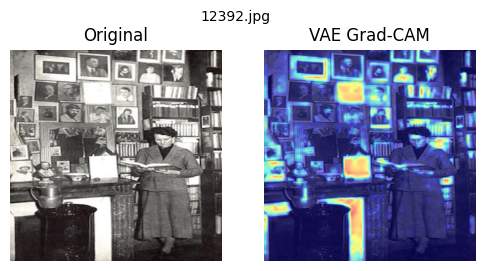

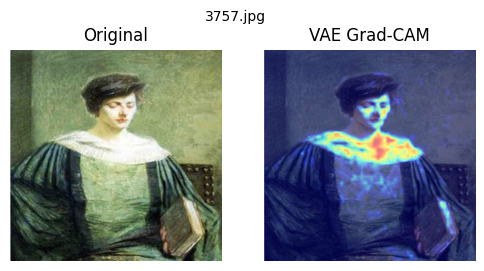

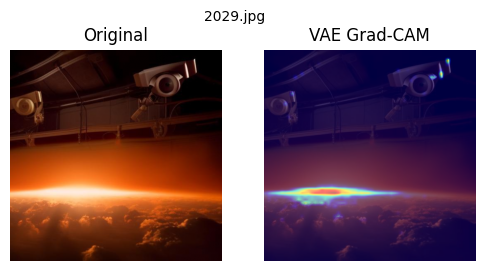

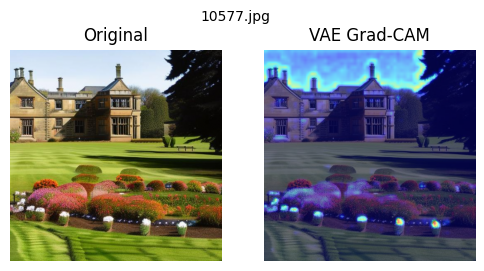

In [ ]:
import torch, numpy as np, os, random
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

# --- select test samples ---
test_human_dir = "data/ai_art_split/test/NON_AI_GENERATED"
test_ai_dir    = "data/ai_art_split/test/AI_GENERATED"
human_examples = random.sample(os.listdir(test_human_dir), 2)
ai_examples    = random.sample(os.listdir(test_ai_dir), 2)
example_paths  = [os.path.join(test_human_dir, f) for f in human_examples] + \
                 [os.path.join(test_ai_dir, f) for f in ai_examples]

print("🖼 Selected examples:")
for e in example_paths: print(" -", e)

# --- transform setup ---
vae_tfms = transforms.Compose([
    transforms.Resize((512,512), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t * 2.0 - 1.0)
])

# --- Grad-CAM setup for Stable Diffusion Turbo VAE encoder ---
target_layer = pipe.vae.encoder.down_blocks[-1].resnets[-1]
cam = GradCAM(model=pipe.vae.encoder, target_layers=[target_layer])

# --- dummy target (since VAE isn't a classifier) ---
class DummyTarget:
    def __call__(self, model_output):
        # Use average activation as a scalar target
        return model_output.mean()

# --- visualize ---
for path in example_paths:
    pil_img = Image.open(path).convert("RGB")
    img_tensor = vae_tfms(pil_img).unsqueeze(0).to(device, dtype=pipe.vae.dtype)

    # manually encode
    posterior = pipe.vae.encode(img_tensor)
    latent = posterior.latent_dist.mean

    # run Grad-CAM
    grayscale_cam = cam(input_tensor=img_tensor, targets=[DummyTarget()])[0]

    rgb_img = np.array(pil_img.resize((512,512))) / 255.0
    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1); plt.imshow(rgb_img); plt.title("Original"); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(cam_image); plt.title("VAE Grad-CAM"); plt.axis('off')
    plt.suptitle(os.path.basename(path), fontsize=10)
    plt.show()

### Grad-CAM for U-Net cross-attention layers
Attempts to visualize U-Net attention mechanisms within SD-Turbo using Grad-CAM to understand how cross-attention layers respond to text prompts and image structure.

*This does not yet work as intended; to be polished in Next Steps.*

In [ ]:
import torch, numpy as np, os, random, matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from diffusers import StableDiffusionPipeline
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# --- setup ---
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe = StableDiffusionPipeline.from_pretrained(
    "stabilityai/sd-turbo",
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None
).to(device)
pipe.enable_attention_slicing()

# --- select sample images ---
test_human_dir = "data/ai_art_split/test/NON_AI_GENERATED"
test_ai_dir    = "data/ai_art_split/test/AI_GENERATED"
human_examples = random.sample(os.listdir(test_human_dir), 2)
ai_examples    = random.sample(os.listdir(test_ai_dir), 2)
example_paths  = [os.path.join(test_human_dir, f) for f in human_examples] + \
                 [os.path.join(test_ai_dir, f) for f in ai_examples]

# --- assign prompts (2 for human, 2 for AI) ---
prompts = [
    "a candid photograph of a real person taken with a DSLR camera",  # Non-AI 1
    "a detailed realistic human portrait in natural lighting",         # Non-AI 2
    "a digital artwork of a woman made of stained glass, surreal style", # AI 1
    "a fantasy concept art painting of a city in clouds"               # AI 2
]

# --- print which prompt goes with which image ---
print("\n🧾 Prompt mapping for Grad-CAM run:")
for pth, prmpt in zip(example_paths, prompts):
    print(f"• {os.path.basename(pth)}  →  \"{prmpt}\"")

# --- preprocessing ---
vae_tfms = transforms.Compose([
    transforms.Resize((512,512), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t * 2.0 - 1.0)
])

# --- target layer (cross-attention) ---
target_layer = pipe.unet.down_blocks[2].attentions[0].transformer_blocks[0].attn2
cam = GradCAM(model=pipe.unet, target_layers=[target_layer])

class DummyTarget:
    def __call__(self, model_output):
        return model_output[0].mean()

# --- Grad-CAM loop ---
for img_path, prompt in zip(example_paths, prompts):
    print(f"\n🖼  Processing {os.path.basename(img_path)}")
    print(f"🗣️  Prompt used: {prompt}")

    pil_img = Image.open(img_path).convert("RGB")
    rgb_img = np.array(pil_img.resize((512,512))) / 255.0
    img_tensor = vae_tfms(pil_img).unsqueeze(0).to(device, dtype=pipe.vae.dtype)

    # Text embedding
    text_inputs = pipe.tokenizer(prompt, return_tensors="pt", padding=True).to(device)
    text_embeds = pipe.text_encoder(**text_inputs).last_hidden_state

    # Latents
    with torch.no_grad():
        posterior = pipe.vae.encode(img_tensor)
        latents = posterior.latent_dist.mean * 0.18215

    # Grad-CAM
    grayscale_cam = cam(input_tensor=latents, targets=[DummyTarget()], eigen_smooth=True)[0]

    # Decode and overlay
    with torch.no_grad():
        decoded = pipe.vae.decode(latents).sample
    img_decoded = (decoded[0].permute(1,2,0).cpu().numpy() * 0.5 + 0.5).clip(0,1)
    cam_image = show_cam_on_image(img_decoded, grayscale_cam, use_rgb=True)

    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1); plt.imshow(img_decoded); plt.title("Decoded Image"); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(cam_image); plt.title("U-Net Cross-Attn Grad-CAM"); plt.axis('off')
    plt.suptitle(f"{os.path.basename(img_path)}\nPrompt: {prompt}", fontsize=9)
    plt.tight_layout()
    plt.show()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Grad-CAM on CLIP
Explores extending Grad-CAM to CLIP’s image-text encoder for interpreting how semantic alignment with text prompts differs between AI-generated and human art (not yet finalized).

*This does not yet work as intended; to be polished in Next Steps.*

In [ ]:
import os, random, torch, numpy as np, matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from diffusers import StableDiffusionPipeline
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# --- setup ---
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe = StableDiffusionPipeline.from_pretrained(
    "stabilityai/sd-turbo",
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None
).to(device)
pipe.enable_attention_slicing()

# --- define prompts used for augmentation ---
prompt_base = {
    "AI_GENERATED": "digital futuristic artwork, smooth vivid colors, hyperrealistic lighting",
    "NON_AI_GENERATED": "traditional painting, brush strokes, canvas texture, artistic imperfections"
}

# --- select sample images ---
base_dir = "data/ai_art_split/test"
classes = ["NON_AI_GENERATED", "AI_GENERATED"]
sample_paths = []

for c in classes:
    c_dir = os.path.join(base_dir, c)
    imgs = random.sample(
        [os.path.join(c_dir, f) for f in os.listdir(c_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))],
        2
    )
    sample_paths.extend([(p, c) for p in imgs])

print("🖼 Selected examples:")
for path, c in sample_paths:
    print(f" - {os.path.basename(path)} ({c})")

# --- preprocessing ---
vae_tfms = transforms.Compose([
    transforms.Resize((512,512), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t * 2.0 - 1.0)
])

# --- wrapper around U-Net to inject timestep + prompt embedding ---
class UNetWrapper(torch.nn.Module):
    def __init__(self, unet, encoder_hidden_states, timestep):
        super().__init__()
        self.unet = unet
        self.encoder_hidden_states = encoder_hidden_states
        self.timestep = timestep
    def forward(self, latents):
        return self.unet(latents, self.timestep, self.encoder_hidden_states).sample

# --- main loop ---
for img_path, class_label in sample_paths:
    prompt = prompt_base[class_label]
    print(f"\n🧩 Image: {os.path.basename(img_path)}")
    print(f"   → Class: {class_label}")
    print(f"   → Prompt: {prompt}")

    # prepare image & latents
    pil_img = Image.open(img_path).convert("RGB")
    rgb_img = np.array(pil_img.resize((512,512))) / 255.0
    img_tensor = vae_tfms(pil_img).unsqueeze(0).to(device, dtype=pipe.vae.dtype)
    with torch.no_grad():
        posterior = pipe.vae.encode(img_tensor)
        latents = posterior.latent_dist.mean * 0.18215

    # encode text prompt
    text_inputs = pipe.tokenizer(prompt, return_tensors="pt", padding=True).to(device)
    encoder_hidden_states = pipe.text_encoder(**text_inputs).last_hidden_state
    timestep = torch.tensor([50], device=device, dtype=torch.long)  # arbitrary mid-diffusion step

    # wrap model
    wrapped_unet = UNetWrapper(pipe.unet, encoder_hidden_states, timestep)

    # choose layer for Grad-CAM (cross-attention)
    target_layer = pipe.unet.down_blocks[2].attentions[0].transformer_blocks[0].attn2
    cam = GradCAM(model=wrapped_unet, target_layers=[target_layer])

    class DummyTarget:
        def __call__(self, model_output):
            return model_output.mean()

    # run Grad-CAM
    grayscale_cam = cam(input_tensor=latents, targets=[DummyTarget()], eigen_smooth=True)[0]

    # decode for display
    with torch.no_grad():
        decoded = pipe.vae.decode(latents).sample
    img_decoded = (decoded[0].permute(1,2,0).cpu().numpy() * 0.5 + 0.5).clip(0,1)
    cam_image = show_cam_on_image(img_decoded, grayscale_cam, use_rgb=True)

    # display
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(img_decoded)
    plt.title(f"Decoded ({class_label})")
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(cam_image)
    plt.title("U-Net Cross-Attn Grad-CAM")
    plt.axis('off')
    plt.suptitle(f"{os.path.basename(img_path)}\nPrompt: {prompt}", fontsize=9)
    plt.tight_layout()
    plt.show()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


🖼 Selected examples:
 - 5349.jpg (NON_AI_GENERATED)
 - 14242.jpg (NON_AI_GENERATED)
 - 9870.jpg (AI_GENERATED)
 - 313.jpg (AI_GENERATED)

🧩 Image: 5349.jpg
   → Class: NON_AI_GENERATED
   → Prompt: traditional painting, brush strokes, canvas texture, artistic imperfections


ValueError: Invalid grads shape.Shape of grads should be 4 (2D image) or 5 (3D image).